### Objectives of this notebook:
- display output from ABRM
- perform analysis on output. eg. feature importance and model selection
- in console do: jupyter nbconvert --to="python" '.\Postprocessing.ipynb'
- this will upload the file in pure python format

In [1]:
import numpy as np
import pandas as pd
import plotly.io as pio
from postprocessing import postprocessing
pio.renderers.default = "notebook"


### Import data
- one df with FD performance of each particle  
- one df with associated particle position  
- one dicct with initial setup that would allow reproduction of results

In [3]:
# dataset = ["2020_08_25_11_25"]
# dataset = ["2020_08_26_19_14"]
# dataset = ["2020_09_11_11_20"]
# dataset = ["2020_09_12_11_04"]
# dataset = ["2020_09_21_16_09"]
# dataset = ["2020_09_15_18_04"]
# dataset = ["2020_09_14_17_35"]
# dataset = ["2020_09_22_22_35"]
dataset = ["2020_10_02_13_39"]
# dataset = ["2020_10_01_14_12"]

#


data = postprocessing(dataset)
data.read_data()

<class 'pandas.core.frame.DataFrame'>
(2520000, 9)


,EV,tD,F,Phi,LC,tof,iteration,particle_no,misfit
0,0.000000,0.000000,0.000000,0.000000,0.155868,44943056.0,0,0,0.292166
1,0.524932,0.524932,0.000002,0.000001,0.155868,48835536.0,0,0,0.292166
2,0.525156,0.525156,0.000005,0.000002,0.155868,54906080.0,0,0,0.292166
3,0.525504,0.525504,0.000007,0.000004,0.155868,61439572.0,0,0,0.292166
4,0.527702,0.527702,0.000009,0.000005,0.155868,66939812.0,0,0,0.292166


140000
Number of models and parameters:


(18, 37)

Number of particles:


6

Number of Iterations:


3

,EV,tD,F,Phi,LC,tof,iteration,particle_no,misfit,dataset
0,0.000000,0.000000,0.000000,0.000000,0.155868,44943056.0,0,0,0.292166,2020_10_02_13_39
1,0.524932,0.524932,0.000002,0.000001,0.155868,48835536.0,0,0,0.292166,2020_10_02_13_39
2,0.525156,0.525156,0.000005,0.000002,0.155868,54906080.0,0,0,0.292166,2020_10_02_13_39
3,0.525504,0.525504,0.000007,0.000004,0.155868,61439572.0,0,0,0.292166,2020_10_02_13_39
4,0.527702,0.527702,0.000009,0.000005,0.155868,66939812.0,0,0,0.292166,2020_10_02_13_39


,TI1,F1_I_MIN,F1_I_MAX,F1_J_MIN,F1_J_MAX,F1_K_MIN,F1_K_MAX,TI2,F2_I_MIN,F2_I_MAX,...,MatrixpermY,FracpermZ,MatrixpermZ,misfit,LC,iteration,particle_no,tof_based_entropy_best_models,entropy_slope,dataset
0,3.0,50.0,75.0,18.0,22.0,2.0,4.0,4.0,8.0,123.0,...,2.665468,243.38608,59.883102,0.292166,0.155868,0,0,0,0.0,2020_10_02_13_39
1,1.0,8.0,152.0,16.0,51.0,3.0,3.0,3.0,87.0,196.0,...,65.999240,122.12856,77.251590,0.270853,0.168366,0,1,0,0.0,2020_10_02_13_39
2,3.0,110.0,187.0,74.0,97.0,3.0,5.0,3.0,103.0,132.0,...,26.569324,899.74990,49.742336,0.236159,0.171595,0,2,0,0.0,2020_10_02_13_39
3,2.0,134.0,156.0,33.0,94.0,4.0,6.0,1.0,45.0,127.0,...,34.406754,1339.30550,17.055363,0.219393,0.182721,0,3,0,0.0,2020_10_02_13_39
4,2.0,21.0,51.0,70.0,88.0,2.0,6.0,3.0,69.0,145.0,...,9.603785,819.72327,37.561280,0.311991,0.130559,0,4,0,0.0,2020_10_02_13_39


,tof,misfit,iteration,particle_no,dataset
0,44943056.0,0.292166,0,0,2020_10_02_13_39
1,48835536.0,0.292166,0,0,2020_10_02_13_39
2,54906080.0,0.292166,0,0,2020_10_02_13_39
3,61439572.0,0.292166,0,0,2020_10_02_13_39
4,66939812.0,0.292166,0,0,2020_10_02_13_39


In [3]:
data.get_df_best(misfit_tolerance = 0.15 ,window_shape = (1,1,1),step_size = 1)


### Plot performance

In [4]:
pio.renderers.default = "browser"
data.plot_performance()

### Histogram Paramters

In [5]:
pio.renderers.default = "notebook"
data.plot_hist(misfit_tolerance= False)

### Histograms for best models parameters

In [5]:
data.plot_hist()

### Boxplots parameters
explore if ranges of parameters need potential modifications

In [67]:
data.plot_box()

### Grid distribution of time of flight and entropy based on time of flight of best models

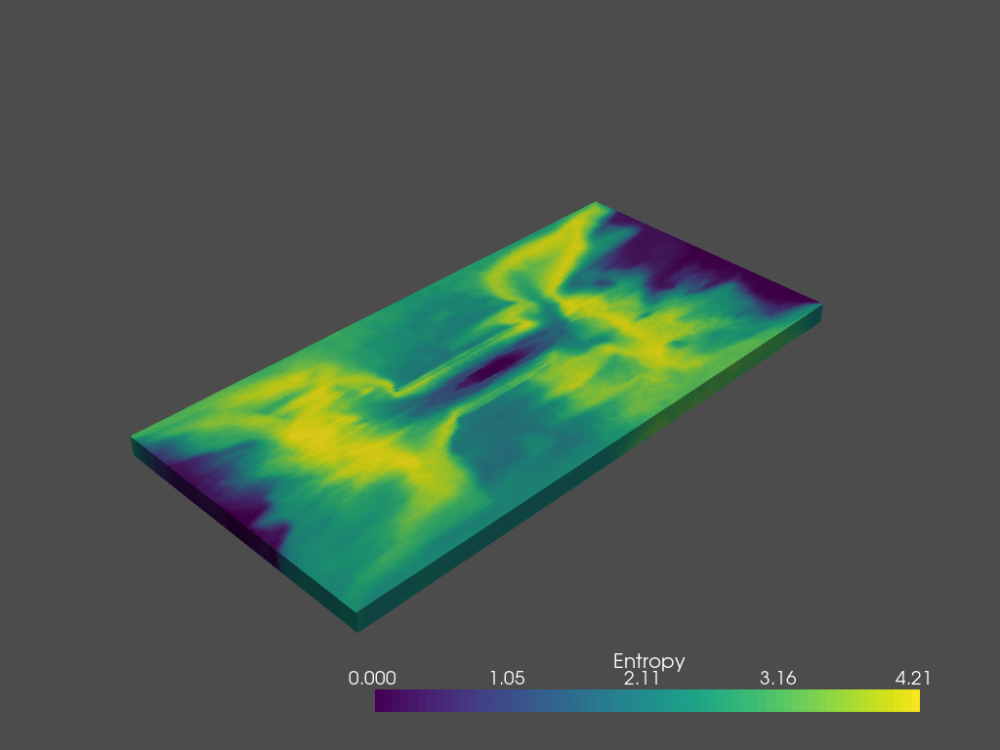

In [6]:
data.plot_tof_entropy()

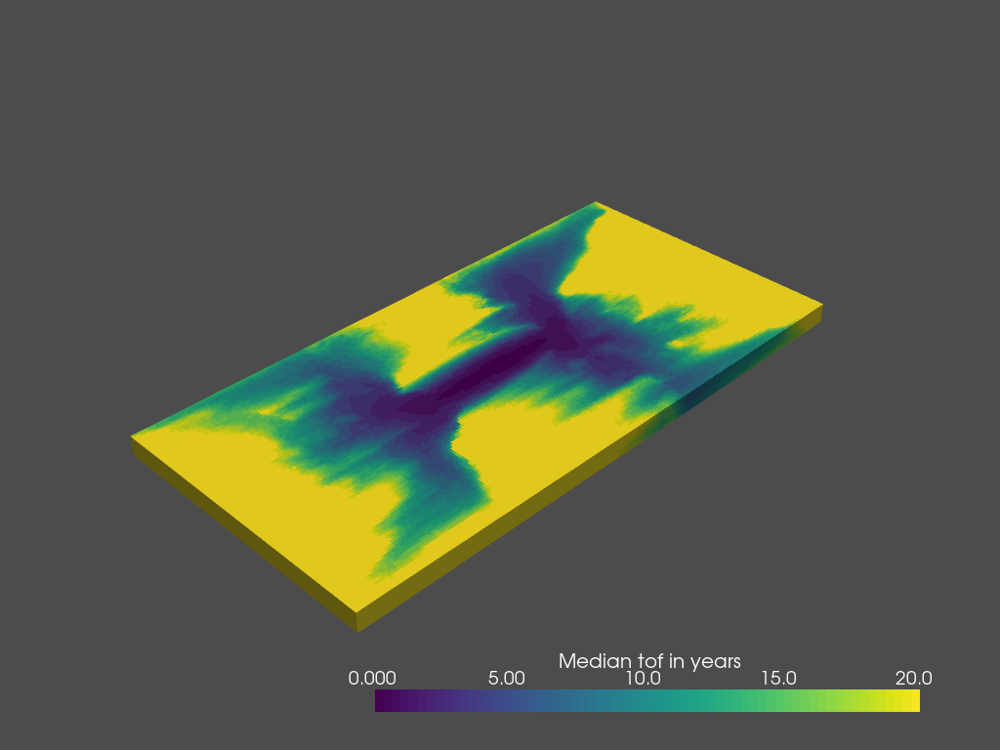

In [7]:
data.plot_tof_best_models()

### Plot one of the best models

In [61]:
data.plot_best_model(random_model = False,model_id = 622,property = "PERMZ")

Plotting Model 622
[Geometry] Converting GRDECL to Paraview Hexahedron mesh data....
     NumOfPoints 1120000
     NumOfCells 140000
     .....Done!
[Output] Writing "Results\GRID.vtu" Paraview file....Done!
[Output] Writing "Results\GRID.vtu" Paraview file....Done!
[Output] Writing "Results\GRID.vtp" VTP file..vtp file created.


### Cluster best models with UMAP and HDBSCAN

In [8]:
data.clustering_tof_or_PSO(cluster_parameter="tof")

C:\Users\bs48\AppData\Local\Continuum\anaconda_3\envs\ABRM\lib\site-packages\numba\np\ufunc\parallel.py:355: NumbaWarning:

The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 11000. The TBB threading layer is disabled.



In [9]:
data.clustering_sweep_efficiency_or_F_Phi(cluster_parameter="F_Phi")

### Selection of models to save

In [50]:
data.cluster_model_selection(include_unclustered= True,cluster_parameter = "F_Phi",n_reservoir_models=20)


### Save selected models, ready for flow simulation

In [221]:
i = 12
delta = 5
iterations = np.array(np.arange(i-delta,i))
entropy = []
for i in range(delta):
    entropy.append(np.array(data.df_position[(data.df_position.iteration ==iterations[i]) & (data.df_position.particle_no ==0)].tof_based_entropy_best_models))


TypeError: only integer scalar arrays can be converted to a scalar index

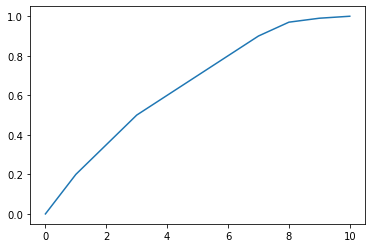

In [227]:
F_points_target = np.array([0, 0.2, 0.35, 0.5, 0.6, 0.7, 0.8, 0.9, 0.97, 0.99, 1])
plt.plot(F_points_target)


In [230]:
iteration = 2
n_particles = 3
particles = np.arange(0,n_particles)

In [236]:
data.df_performance[data.df_performance ==particles[0]].LC.unique()

array([nan])

In [241]:
nested_dict = { '0': {'key_1': 'value_1'},
                '1': {'key_2': 'value_2'}}

In [243]:
nested_dict["0"]["key_1"]

'value_1'

In [253]:
iterations = data.df_position["iteration"].unique().tolist()
entropy = []
for i in range(len(iterations)):
    entropy.append(np.array(data.df_position[(data.df_position.iteration ==iterations[i]) & (data.df_position.particle_no ==0)].tof_based_entropy_best_models))


reset PSO and pbest 18
reset PSO and pbest 19
reset PSO and pbest 20
reset PSO and pbest 23
reset PSO and pbest 24


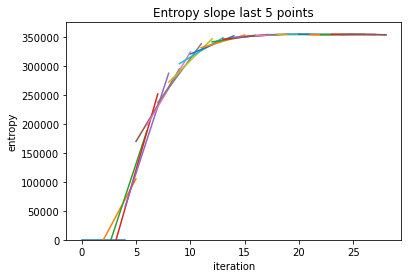

In [267]:
linear_regressor = LinearRegression()
coefficient = []
delta = 5
# entropy = entropy[0:2]
if len(entropy)< delta:
    pass
else:
    for i in range(len(entropy)-delta):
        Y = entropy[i:i+delta]
        X = np.arange(i,i+delta).reshape(-1,1)
        linear_regressor.fit(X,Y)
        Y_pred = linear_regressor.predict(X)
        plt.plot(X,Y_pred)
        coefficient.append(linear_regressor.coef_)
        if coefficient[i] < 0:
            print("reset PSO and pbest {}".format(i))
    plt.plot(X,Y)
    plt.xlabel("iteration")
    plt.ylabel("entropy")
    plt.ylim(0)
    plt.title("Entropy slope last 5 points")

Text(0, 0.5, 'entropy')

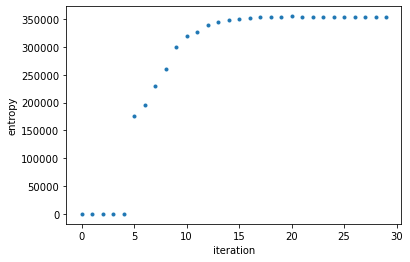

In [260]:
plt.plot(entropy,".")
plt.xlabel("iteration")
plt.ylabel("entropy")

In [214]:
entropy.append(entropy)

ValueError: x and y can be no greater than 2-D, but have shapes (25,) and (25, 1, 1)

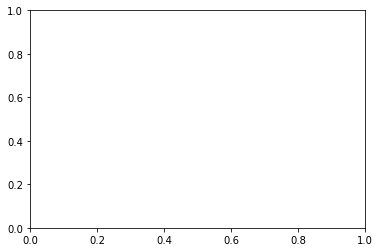

In [255]:
plt.plot(coefficient)
# plt.ylim(-1000,0)


(array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 1.],
        [0., 0., 0., 0., 0., 1., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 1., 0., 0., 0., 0.],
        [0., 0., 0., 0., 1., 0., 0., 0., 0., 0.],
        [0., 0., 0., 1., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],


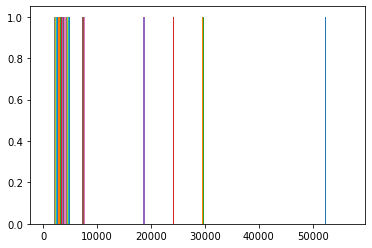

In [145]:
from scipy import interpolate
from scipy.signal import find_peaks
from sklearn.linear_model import LinearRegression

entropy = np.array(data.df_position.tof_based_entropy_best_models.unique())
iteration = np.array(np.linspace(0,25,26))
# iteration = np.array(np.linspace(0,10,10))
# iteration = interpolate.splrep(iteration,entropy, s = 0)
entropy_first_derr = np.gradient(entropy,iteration)


In [53]:
entropy_first_derr

array([ 1.75199816e+05,  9.80414184e+04,  2.74321224e+04,  3.18039216e+04,
        3.47008678e+04,  2.95943245e+04,  1.40220222e+04,  1.03366192e+04,
        8.75099037e+03,  4.81292271e+03,  2.49285688e+03,  1.20468491e+03,
        1.83544406e+03,  8.55974889e+02,  3.48212705e+02,  9.45350844e+02,
       -3.90229502e+02, -9.61703296e+02,  5.26510979e+02,  2.74156733e+02,
       -2.64764136e+02,  1.63548284e+02, -8.37060687e+01, -4.25969239e+02,
        1.33978442e+02,  9.17929332e+02])

(300000.0, 400000.0)

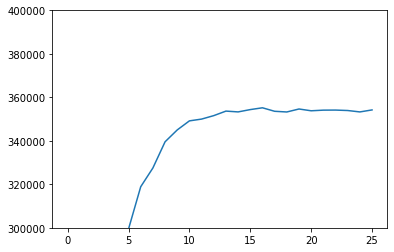

In [66]:
plt.plot(data.df_position.tof_based_entropy_best_models.unique())
plt.plot(entropy_first_derr)
plt.ylim([300000,400000])
# can see that after 10 iteration there is no improvvement for the tof entropy anymore
# and I think that all following models just converge towards a couple of best solutions.
# what to do: "restart" ie redistribute particles again and dont give them any prior knowledge?
# check every 10 iterations what gradient is. if its not moving --> move models around and reset global bests_

In [123]:
a = []
std = []
for i in range(len(entropy)-5):
    a.append(np.mean(entropy[i:i+5]))
    std.append(np.std(entropy[i:i+5]))


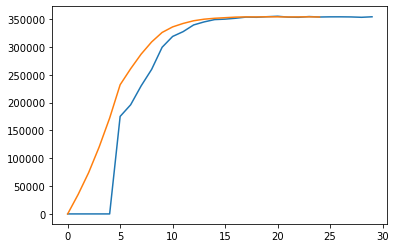

In [126]:
plt.plot(entropy)
plt.plot(a)
# plt.plot(np.sign(np.diff(entropy)))

TypeError: 'numpy.ndarray' object is not callable

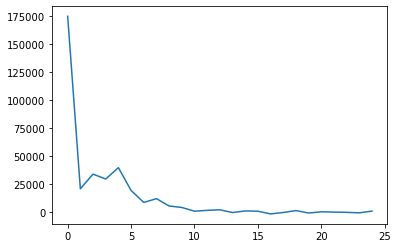

In [74]:
peaks,_ = find_peaks(np.diff(entropy),height =0)
plt.plot(np.diff(entropy))
plt.plot(peaks,np.diff(entropy([peaks])))

In [137]:
def zero_slope(data, chunksize =4, max_slope = .5):
    midindex = chunksize // 2
    is_plateau = np.zeros((data.shape[0]))
    for index in range(midindex, len(data) - midindex):
        chunk = data[index - midindex : index + midindex]
        # subtract the endpoints of the chunk
        # if not sufficient, maybe use a linear fit
        dy_dx = abs(chunk[0] - chunk[-1])/chunksize
        print(dy, dx, dy / dx)
        if (0 <= dy / dx < max_slope):
            is_plateau[index] = 1.0
    return is_plateau

In [144]:
entropy = np.array(entropy)
chunksize = 4
midindex = chunksize // 2
is_plateau = np.zeros((entropy.shape[0]))
for index in range(midindex, len(entropy) - midindex):
    chunk = entropy[index - midindex : index + midindex]
    # subtract the endpoints of the chunk
    # if not sufficient, maybe use a linear fit
    dy,dx = abs(chunk[0] - chunk[-1])/chunksize
    print(dy, dx, dy / dx)
    if (0 <= dy / dx < max_slope):
        is_plateau[index] = 1.0

ValueError: not enough values to unpack (expected 2, got 1)

In [133]:
x = np.arange(0,len(entropy))

# Tests

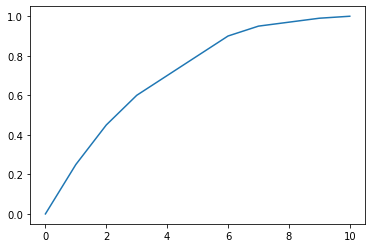

In [21]:
F_points_target = np.array([0, 0.25, 0.45, 0.6, 0.7, 0.8, 0.90, 0.95, 0.97, 0.99, 1])
plt.plot(F_points_target)

In [6]:
import pyvista as pv
from pyentrp import entropy as ent
from skimage.util.shape import view_as_windows
from sklearn import preprocessing 
import hdbscan
import umap
import matplotlib. pyplot as plt
from GRDECL_file_reader.GRDECL2VTK import *


In [9]:
Model = GeologyModel(filename = "C:/AgentBased_RM/FD_Models/INCLUDE/GRID.GRDECL")
TempData=Model.LoadCellData(varname="PORO",filename='C:/AgentBased_RM/Output/2020_08_25_11_25/best_models/INCLUDE/PORO/M0.GRDECL')

### Feature importance - model explainability

In [16]:
import shap
from sklearn.ensemble import RandomForestRegressor


In [28]:
data.setup_all["2020_09_14_17_35"]["columns"]

['TI1',
 'F1_I_MIN',
 'F1_I_MAX',
 'F1_J_MIN',
 'F1_J_MAX',
 'F1_K_MIN',
 'F1_K_MAX',
 'TI2',
 'F2_I_MIN',
 'F2_I_MAX',
 'F2_J_MIN',
 'F2_J_MAX',
 'F2_K_MIN',
 'F2_K_MAX',
 'TI3',
 'F3_I_MIN',
 'F3_I_MAX',
 'F3_J_MIN',
 'F3_J_MAX',
 'F3_K_MIN',
 'F3_K_MAX',
 'F1_Curve_Prob',
 'F2_Curve_Prob',
 'F3_Curve_Prob',
 'FracpermX',
 'MatrixpermX',
 'FracpermY',
 'MatrixpermY',
 'FracpermZ',
 'MatrixpermZ']

In [30]:
columns = data.setup_all["2020_09_14_17_35"]["columns"]
X_train = data.df_position[columns]
Y_train = data.df_position.LC

In [31]:
# load JS visualization code to notebook
shap.initjs()

In [32]:
model = RandomForestRegressor(max_depth=6, random_state=0, n_estimators=10)
model.fit(X_train, Y_train)

RandomForestRegressor(max_depth=6, n_estimators=10, random_state=0)

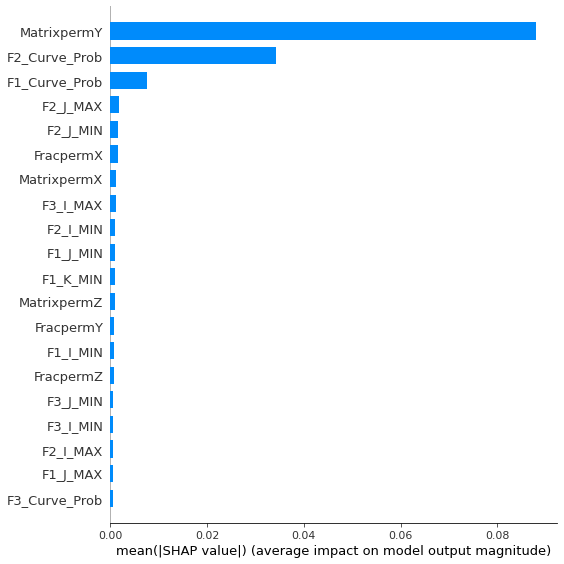

In [33]:
shap_values = shap.TreeExplainer(model).shap_values(X_train)
shap.summary_plot(shap_values, X_train, plot_type="bar")

In [34]:
# explain the model's predictions using SHAP
# (same syntax works for LightGBM, CatBoost, scikit-learn and spark models)
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_train)

# visualize the first prediction's explanation (use matplotlib=True to avoid Javascript)
shap.force_plot(explainer.expected_value, shap_values[80,:], X_train.iloc[80,:])

In [35]:
# visualize the training set predictions
shap.force_plot(explainer.expected_value, shap_values, X_train)

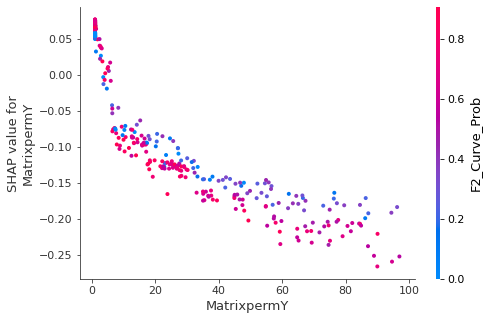

In [36]:
# create a dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot("MatrixpermY", shap_values, X_train)

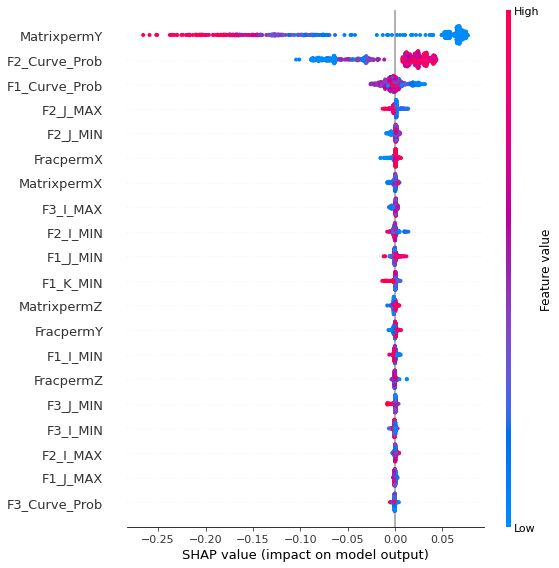

In [37]:
shap.summary_plot(shap_values, X_train)
